# Restaurant Revenue EDA and Prediction Algorothims Project. 

## Introduction: 
- The purpose of this project is to unveil hidden and actionable insights to a sample restaurant dataset while implementing different ML models to find out which model best predicts revenue.

## Table of Contents:
1. Importing the libraries.
2. Loading the dataset.
3. Exploring the dataset.
4. Data Wrangling.
5. Exploratory data Analysis.
6. Building the Revenue Prediction Models.
7. Conclusion.
8. Application.

### Importing the Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import xgboost
import matplotlib.pyplot as plt
import sklearn

%matplotlib inline

### Loading the dataset

In [2]:
df = pd.read_csv("restaurant_data.csv")


df.head()

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
0,Restaurant 0,Rural,Japanese,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,Yes,13,4,638945.52
1,Restaurant 1,Downtown,Mexican,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,Yes,48,6,490207.83
2,Restaurant 2,Rural,Italian,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,No,27,14,541368.62
3,Restaurant 3,Rural,Italian,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,Yes,9,17,404556.80
4,Restaurant 4,Downtown,Japanese,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,No,37,26,1491046.35


### Exploring the dataset

In [3]:
## shape

df.shape

(8368, 17)

In [4]:
## various datatypes

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8368 entries, 0 to 8367
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Name                    8368 non-null   object 
 1   Location                8368 non-null   object 
 2   Cuisine                 8368 non-null   object 
 3   Rating                  8368 non-null   float64
 4   Seating Capacity        8368 non-null   int64  
 5   Average Meal Price      8368 non-null   float64
 6   Marketing Budget        8368 non-null   int64  
 7   Social Media Followers  8368 non-null   int64  
 8   Chef Experience Years   8368 non-null   int64  
 9   Number of Reviews       8368 non-null   int64  
 10  Avg Review Length       8368 non-null   float64
 11  Ambience Score          8368 non-null   float64
 12  Service Quality Score   8368 non-null   float64
 13  Parking Availability    8368 non-null   object 
 14  Weekend Reservations    8368 non-null   

In [5]:
## summary statistics

df.describe()

,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Weekend Reservations,Weekday Reservations,Revenue
count,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8.368000e+03
mean,4.008258,60.212835,47.896659,3218.254900,36190.621773,10.051984,523.010397,174.769974,5.521283,5.508772,29.491754,29.235301,6.560706e+05
std,0.581474,17.399488,14.336767,1824.896053,18630.153330,5.516606,277.215127,71.998060,2.575442,2.586552,20.025415,20.004277,2.674137e+05
min,3.000000,30.000000,25.000000,604.000000,5277.000000,1.000000,50.000000,50.011717,1.000000,1.000000,0.000000,0.000000,1.847085e+05
25%,3.500000,45.000000,35.490000,1889.000000,22592.500000,5.000000,277.000000,113.311102,3.300000,3.200000,13.000000,13.000000,4.546514e+05
50%,4.000000,60.000000,45.535000,2846.500000,32518.500000,10.000000,528.000000,173.910079,5.500000,5.600000,27.000000,26.000000,6.042421e+05
75%,4.500000,75.000000,60.300000,4008.500000,44566.250000,15.000000,764.250000,237.406885,7.800000,7.800000,43.000000,43.000000,8.130942e+05
max,5.000000,90.000000,76.000000,9978.000000,103777.000000,19.000000,999.000000,299.984924,10.000000,10.000000,88.000000,88.000000,1.531868e+06


In [6]:
## more descriptive statistics about the dataset

numeric = df.drop(columns = ["Name", "Location", "Cuisine", "Parking Availability"])

from scipy.stats import describe

description = describe(numeric)

# presenting the results
for key, value in description._asdict().items():
    print(f"{key} : {value}")

nobs : 8368
minmax : (array([3.00000000e+00, 3.00000000e+01, 2.50000000e+01, 6.04000000e+02,
       5.27700000e+03, 1.00000000e+00, 5.00000000e+01, 5.00117174e+01,
       1.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.84708520e+05]), array([5.00000000e+00, 9.00000000e+01, 7.60000000e+01, 9.97800000e+03,
       1.03777000e+05, 1.90000000e+01, 9.99000000e+02, 2.99984924e+02,
       1.00000000e+01, 1.00000000e+01, 8.80000000e+01, 8.80000000e+01,
       1.53186755e+06]))
mean : [4.00825765e+00 6.02128346e+01 4.78966587e+01 3.21825490e+03
 3.61906218e+04 1.00519837e+01 5.23010397e+02 1.74769974e+02
 5.52128346e+00 5.50877151e+00 2.94917543e+01 2.92353011e+01
 6.56070563e+05]
variance : [3.38111557e-01 3.02742195e+02 2.05542881e+02 3.33024560e+06
 3.47082613e+08 3.04329374e+01 7.68482269e+04 5.18372060e+03
 6.63290300e+00 6.69025172e+00 4.01017262e+02 4.00171112e+02
 7.15101068e+10]
skewness : [-0.01296379 -0.00967565  0.31244396  1.129376    1.08248662 -0.00888951


### Data Wrangling

In [7]:
## checking for any duplicates

df.duplicated().sum()

0

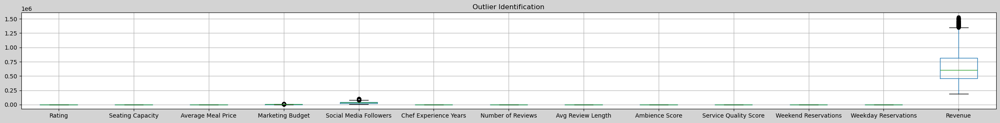

In [8]:
## checking for any outliers

plt.figure(facecolor="lightgrey", figsize=(30,3))
df.boxplot()
plt.title("Outlier Identification")
plt.show()

In [9]:
## dealing with outliers in the revenue column

# calculating the inter-quartile rannge (iqr)
q1 = df["Revenue"].quantile(0.25)
q3 = df["Revenue"].quantile(0.75)

iqr = q3 - q1

# calculating the upper and lower limit
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)

# removing the outliers

df1 = df.loc[(df["Revenue"] < upper_limit) & (df["Revenue"] > lower_limit)]

# checking the no of ouliers removed
print("Outliers Removed:", len(df) - len(df1))

Outliers Removed: 102


In [10]:
## adding columns 

df1["Total Reservations"] = df1["Weekend Reservations"] + df1["Weekday Reservations"]

df1.tail(1)

C:\Users\Alvin\AppData\Local\Temp\ipykernel_13144\374485892.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["Total Reservations"] = df1["Weekend Reservations"] + df1["Weekday Reservations"]


,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue,Total Reservations
8367,Restaurant 8367,Rural,Japanese,4.0,33,71.07,2003,24268,8,197,151.838065,5.9,7.5,Yes,5,12,534142.98,17


In [13]:
data = df1

### Exploratory Data Analysis

#### KPIs

In [20]:
## Total number of Locations

print("Total No of Locations:", len(data["Location"].unique()))

Total No of Locations: 3


In [21]:
## Total Number of Cuisine

print("Total Number of Cuisines:", len(data["Cuisine"].unique()))

Total Number of Cuisines: 6


In [19]:
## average revenue

print("Average Revenue:", round(data["Revenue"].mean(),1))

Average Revenue: 646732.9


In [22]:
## average rating

print("Average Ratings:", round(data["Rating"].mean(),2))

Average Ratings: 4.01


In [23]:
## average ambience score

print("Average Ambience Score:", round(data["Ambience Score"].mean(),2))

Average Ambience Score: 5.52


#### Visualizations

##### Univariate Analysis

C:\Users\Alvin\AppData\Local\Temp\ipykernel_13144\661255176.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=data["Revenue"], bins=10, color="darkblue")


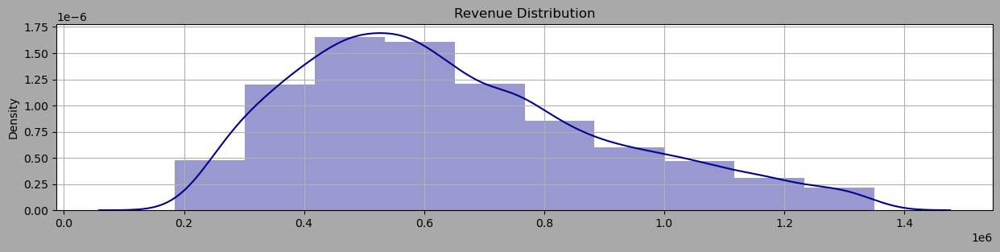

In [24]:
## revenue distribution

plt.figure(facecolor="darkgrey", figsize=(15,3))
sns.distplot(x=data["Revenue"], bins=10, color="darkblue")
plt.grid(True)
plt.title("Revenue Distribution")
plt.show()

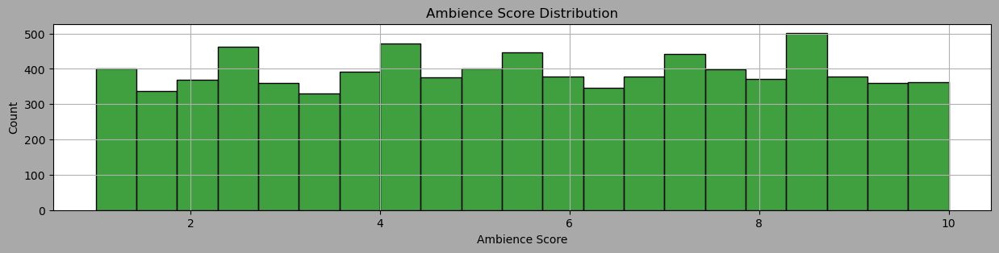

In [25]:
## Ambience Score Distribution 

plt.figure(facecolor="darkgrey", figsize=(15,3))
sns.histplot(x=data["Ambience Score"], color="green")
plt.grid(True)
plt.title("Ambience Score Distribution")
plt.show()

<Figure size 1500x300 with 0 Axes>

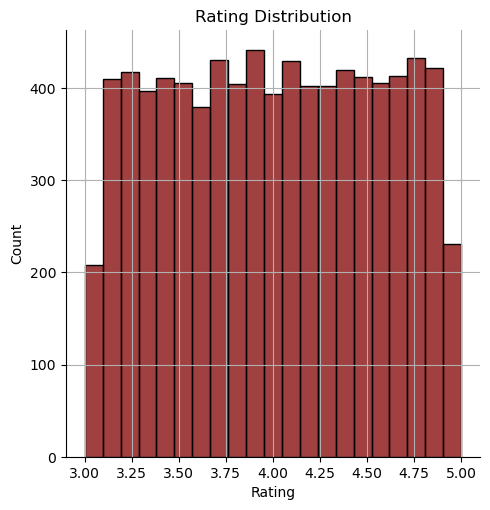

In [26]:
## Rating Distribution 

plt.figure(facecolor="green", figsize=(15,3))
sns.displot(x=data["Rating"], color="maroon")
plt.grid(True)
plt.title("Rating Distribution")
plt.show()

##### Bivariate Analysis

In [27]:
## revenue distribution across the locations

table = pd.pivot_table(data=data, values="Revenue", index=["Location"], aggfunc="mean")
table["Revenue"] = round(table["Revenue"],2)
table

,Revenue
Location,
Downtown,846091.93
Rural,450158.13
Suburban,647049.70


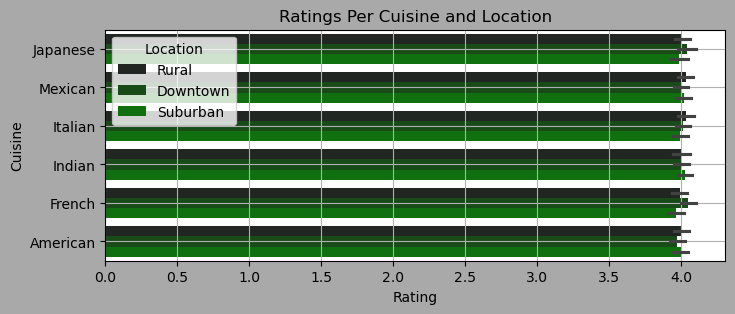

In [28]:
## relationship between the Cuisine and the rating

plt.figure(facecolor="darkgrey", figsize=(8,3))
sns.barplot(data=data, x="Rating", y="Cuisine", palette="dark:green", hue="Location")
plt.grid(True)
plt.title("Ratings Per Cuisine and Location")
plt.show()

##### Multivariate analysis

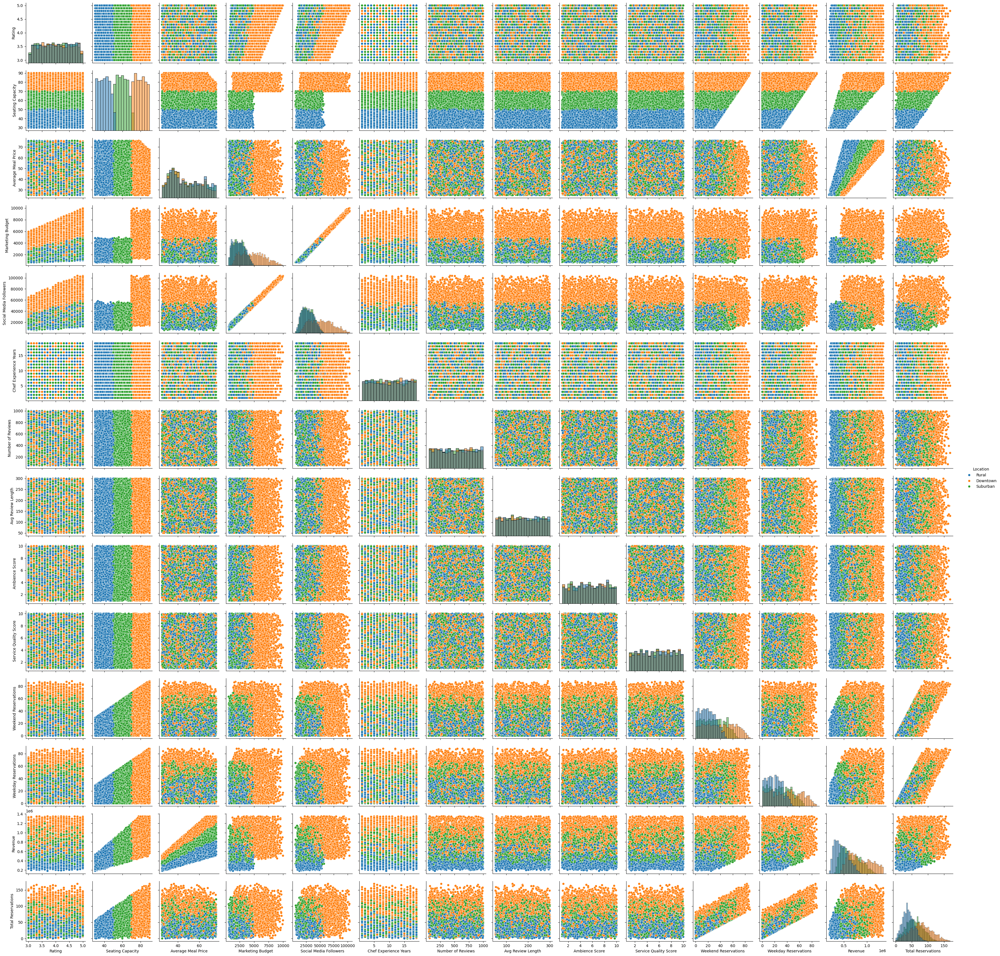

In [30]:
## correlation between nvariables

sns.pairplot(data=data, diag_kind="hist", hue="Location")
plt.show()

### Building the Revenue Prediction Models

In [31]:
data_num = data.drop(["Name", "Location", "Cuisine", "Parking Availability"],axis = 1)

##### Defining the dependent and indepenent variables.

In [32]:
X = data_num.drop(["Revenue"], axis=1) # i.v
y = data_num["Revenue"] #d.v

##### Dividing the data into training and testing sets.

In [33]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25, random_state=20)

#### 1. Linear Regression

In [34]:
## Loading the model 

from sklearn.linear_model import LinearRegression

lr = LinearRegression()

In [35]:
## fitting the model

lr.fit(X_train, y_train)

LinearRegression()

In [37]:
## printing the intercept

print("Linear Regression Intercept:", round(lr.intercept_, 2))

Linear Regression Intercept: -622044.35


In [38]:
## printing the coefficients

coefficients = pd.DataFrame([X_train.columns, lr.coef_]).T
coefficients = coefficients.rename(columns = {0 : "Attribute", 1 : "Coefficients"})
coefficients

,Attribute,Coefficients
0,Rating,1038.025226
1,Seating Capacity,10485.585623
2,Average Meal Price,12973.429702
3,Marketing Budget,-0.617092
4,Social Media Followers,0.242165
5,Chef Experience Years,873.186181
6,Number of Reviews,0.517176
7,Avg Review Length,1.166659
8,Ambience Score,116.849273
9,Service Quality Score,337.254704


In [39]:
## predicting the model

pred = lr.predict(X_test)
pred

array([567803.02212573, 402740.05161853, 740828.96640407, ...,
       685215.18688834, 587186.25808591, 856161.50528244])

In [40]:
## Linear Regression Metrics

from sklearn.metrics import r2_score, mean_absolute_error, mean_absolute_percentage_error , mean_squared_error

print("Mean Absolute Error:", mean_absolute_error(y_test, pred))
print("Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test,pred))
print("Mean Squared Error:", mean_squared_error(y_test,pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred)))
print("R-Squared:", r2_score(y_test, pred))
print("Adjusted R-Sqaured:", 1 - (1 - r2_score(y_test, pred)) * len(y_train - 1) / len(y_train) - X_train.shape[1] - 1)

Mean Absolute Error: 40122.444681452274
Mean Absolute Percentage Error: 0.07890280345506727
Mean Squared Error: 2711603146.337955
Root Mean Squared Error: 52073.05585749654
R-Squared: 0.9593343719170171
Adjusted R-Sqaured: -13.040665628082984


#### 2. Random Forest Regressor

In [41]:
## loading the regressor

from sklearn.ensemble import RandomForestRegressor

rc = RandomForestRegressor()

In [42]:
## fitting the model

rc.fit(X_train, y_train )

RandomForestRegressor()

In [43]:
## predicting the model

pred_rc = rc.predict(X_test)
pred_rc

array([562528.7585, 421674.5918, 628311.7356, ..., 640163.7889,
       564734.937 , 842245.7288])

In [45]:
## Random Forest Regressor Metrics

print("Mean Absolute Error:", mean_absolute_error(y_test, pred_rc))
print("Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test,pred_rc))
print("Mean Squared Error:", mean_squared_error(y_test,pred_rc))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,pred_rc)))
print("R-Squared:", r2_score(y_test, pred_rc))
print("Adjusted R-Squared:", 1 - (1 - r2_score(y_test, pred_rc)) * len(y_train - 1) / len(y_train) - X_train.shape[1]- 1)

Mean Absolute Error: 6150.725468988882
Mean Absolute Percentage Error: 0.01062950348612119
Mean Squared Error: 63385922.55779199
Root Mean Squared Error: 7961.527652265738
R-Squared: 0.9990494079652057
Adjusted R-Squared: -13.000950592034794


#### 3. Xgboost Regressor

In [46]:
## loading the regressor

from xgboost import XGBRegressor

In [48]:
## fitting the model

xgb_reg = XGBRegressor()

xgb_reg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [50]:
## printing the intercept

print("XGBoost Regressor Intercept:", xgb_reg.intercept_)

XGBoost Regressor Intercept: [648507.06]


In [51]:
## predicting the model

xgb_pred = xgb_reg.predict(X_test)
xgb_pred

array([566269.75, 425145.47, 639757.75, ..., 652717.75, 565319.3 ,
       846940.9 ], dtype=float32)

In [52]:
## XGBoost Regressor

print("Mean Absolute Error:", mean_absolute_error(y_test, xgb_pred))
print("Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test,xgb_pred))
print("Mean Squared Error:", mean_squared_error(y_test,xgb_pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,xgb_pred)))
print("R-Squared Error:", r2_score(y_test, xgb_pred))
print("Adjusted R-Squared Error:", 1 - (1 - r2_score(y_test, xgb_pred)) * len(y_train - 1) / len(y_train) - X_train.shape[1] - 1)

Mean Absolute Error: 6270.081061623126
Mean Absolute Percentage Error: 0.010576257159959098
Mean Squared Error: 66436363.60911383
Root Mean Squared Error: 8150.850483790868
R-Squared Error: 0.9990036608205878
Adjusted R-Squared Error: -13.000996339179412


#### 4. SVM Regressor

In [54]:
## Creating a scaled set to be used in the model to improve the results

## importing the standard scalar

from sklearn.preprocessing import StandardScaler

## defining the standard scalar

sc = StandardScaler()

In [55]:
## defining the training and testing dataset

## defining the training and testing dataset

x_train = sc.fit_transform(X_train)
x_test = sc.fit_transform(X_test)

In [56]:
## importing the regressor

from sklearn import svm

svm_reg = svm.SVR()

In [57]:
## fitting the model

svm_reg.fit(x_train,y_train)

SVR()

In [58]:
## printing the intercept

print("SVM Regressor Intercept:", svm_reg.intercept_)

SVM Regressor Intercept: [602249.87899338]


In [59]:
## predicting the model

svm_pred = svm_reg.predict(x_test)
svm_pred

array([601932.15454648, 601945.91639552, 602358.1732461 , ...,
       602307.28176242, 602018.06877644, 602418.69084295])

In [61]:
## SVM Regressor Metrics

print("Mean Absolute Error:", mean_absolute_error(y_test, svm_pred))
print("Mean Absolute Percentage Error:", mean_absolute_percentage_error(y_test, svm_pred))
print("Mean Squared Error:", mean_squared_error(y_test, svm_pred))
print("Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test,svm_pred)))
print("R-Squared Error:", r2_score(y_test, svm_pred))
print("Adjusted R-Squared Error:", 1 - (1 - r2_score(y_test, svm_pred)) * len(y_train - 1) / len(y_train) - X_train.shape[1] - 1)

Mean Absolute Error: 207640.40753397282
Mean Absolute Percentage Error: 0.368386224992334
Mean Squared Error: 68133932730.17113
Root Mean Squared Error: 261024.774169371
R-Squared Error: -0.02179744553622731
Adjusted R-Squared Error: -14.021797445536228


### Conclusion:
The Random Forest Regressor and XGBoost Regressor have the best performance metrics thus best predict revenue of the restaurants.

### Application: 
- The analysis from this project can be used by hoteliers to make data-driven decisions in implementing strategies to boost revenue. 
- Similarly, the models above can be used in:
1. Finance
2. Economic Policy Analysis
3. Banking Industry
4. Production etc.